In [1]:
import geopandas as gpd
import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from GeoConformalizedExplainer import GeoConformalizedExplainer
from fastshap import KernelExplainer

C:\Users\Xiayin\miniconda3\envs\UncertaintyGeoXAI\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data = pd.read_csv('../../data/seattle_sample_3k.csv')

In [3]:
data = gpd.GeoDataFrame(data, crs="EPSG:32610", geometry=gpd.points_from_xy(x=data.UTM_X, y=data.UTM_Y))

In [4]:
data = data.to_crs(4326)

In [5]:
data['lon'] = data['geometry'].get_coordinates()['x']

In [6]:
data['lat'] = data['geometry'].get_coordinates()['y']

In [7]:
data['price'] = np.power(10, data['log_price']) / 10000

In [8]:
y = data.price
X = data[['bathrooms', 'sqft_living', 'sqft_lot', 'grade', 'condition', 'waterfront', 'view', 'age', 'lon', 'lat']]
loc = data[['lon', 'lat']]

In [9]:
X_train, X_temp, y_train, y_temp, loc_train, loc_temp = train_test_split(X, y, loc, train_size=0.8, random_state=42)

In [10]:
X_calib, X_test, y_calib, y_test, loc_calib, loc_test = train_test_split(X_temp, y_temp, loc_temp, train_size=0.5, random_state=42)

In [11]:
model = xgb.XGBRegressor(n_estimators=500, max_depth=3, min_child_weight=1.0, colsample_bytree=1.0)

In [12]:
model.fit(X_train.values, y_train.values)

AttributeError: 'super' object has no attribute '__sklearn_tags__'

AttributeError: 'super' object has no attribute '__sklearn_tags__'

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=1.0, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=1.0, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [13]:
model.score(X_test.values, y_test.values)

0.8678628554694814

In [14]:
feature_names = X_train.columns

In [15]:
def shap_value_f(x):
    explainer_ = KernelExplainer(model.predict, x)
    explainer_.stratify_background_set(5)
    result = explainer_.calculate_shap_values(x, verbose=False, background_fold_to_use=0)
    return result[:, :-1]

In [16]:
explainer = GeoConformalizedExplainer(prediction_f=model.predict,
                                      x_train=X_train,
                                      x_calib=X_calib,
                                      coord_calib=loc_calib.values,
                                      miscoverage_level=0.1,
                                      band_width=0.15,
                                      feature_names=feature_names,
                                      shap_value_f=None)

In [17]:
results = explainer.uncertainty_aware_explain(x_test=X_test, coord_test=loc_test)

100%|██████████| 300/300 [02:43<00:00,  1.84it/s]


Explaining Variables


In [18]:
results.accuracy_summary()

,Mean(|SHAP_value|),Uncertainty,R2,RMSE,SHAP_Var,Pred_SHAP_Var
bathrooms,1.579515,2.567651,0.406252,1.631547,4.483291,0.964159
sqft_living,6.548407,5.993683,0.891372,3.139828,90.755139,91.689703
sqft_lot,3.056538,2.832423,0.831816,1.863410,20.645870,16.885791
grade,6.850731,4.130427,0.960944,2.052629,107.876885,96.466134
condition,1.175643,0.567907,0.884554,0.561977,2.735647,2.636649
waterfront,0.895254,0.317024,0.922966,1.373748,24.498211,18.596458
view,2.258791,1.039978,0.878923,1.891017,29.534360,16.012405
age,2.425636,2.969783,0.594317,2.028779,10.145709,7.387115
lon,3.102505,3.752927,0.641550,2.516091,17.661366,10.339379
lat,13.399657,8.027909,0.973917,2.520333,243.532290,231.887611


In [34]:
results.accuracy_summary().to_csv('./SeattleHomeSale_accuracy_summary.csv')

In [20]:
pred_results = results.result_geo
pred_results

,bathrooms_shap,sqft_living_shap,sqft_lot_shap,grade_shap,condition_shap,waterfront_shap,view_shap,age_shap,lon_shap,lat_shap,...,lat_geo_uncertainty,lat_uncertainty,lat_upper_bound,lat_lower_bound,lat_coverage_probability,lat_pred,lat_shap_abs,x,y,geometry
0,1.624552,9.370777,-0.036907,16.703524,-0.161943,-0.436021,-1.560513,3.976787,-6.075037,8.592533,...,8.169482,8.027909,15.688452,-0.650513,0.99,7.518969,8.592533,-122.178,47.6948,POINT (-122.17800 47.69480)
1,-2.415957,-6.013698,1.170615,-5.973416,1.673330,-0.186330,-1.149481,0.362349,2.416476,-15.563708,...,8.498798,8.027909,-3.464390,-20.461986,0.99,-11.963188,15.563708,-122.364,47.5030,POINT (-122.36400 47.50300)
2,0.123399,-8.033192,-2.445089,-5.254462,-1.377267,-0.243019,4.812038,-1.502561,-2.786748,0.548579,...,8.169482,8.027909,9.812147,-6.526818,0.99,1.642664,0.548579,-122.360,47.5659,POINT (-122.36000 47.56590)
3,-0.679308,-8.320869,-5.059610,-9.110762,0.687402,-0.186253,-1.644993,-0.106248,-2.029641,8.809762,...,8.211404,8.027909,18.437715,2.014906,0.99,10.226311,8.809762,-122.304,47.5880,POINT (-122.30400 47.58800)
4,-0.067477,-5.084491,-4.630304,-5.023703,-0.805558,-0.256892,-1.389983,-0.285916,0.093658,-4.169454,...,8.498798,8.027909,5.877667,-11.119929,0.99,-2.621131,4.169454,-122.288,47.5412,POINT (-122.28800 47.54120)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,0.165035,-4.347191,1.757741,-4.754105,1.261227,-0.252376,-1.567235,-4.714856,-8.521155,15.996563,...,8.498798,8.027909,24.241837,7.244241,0.99,15.743039,15.996563,-122.127,47.6557,POINT (-122.12700 47.65570)
296,0.403499,-0.765790,0.686818,-3.593310,-0.484639,-0.259928,-1.060237,-1.559517,0.771329,-22.226797,...,8.169482,8.027909,-14.076002,-30.414966,0.99,-22.245484,22.226797,-122.242,47.2630,POINT (-122.24200 47.26300)
297,1.596149,17.989393,-2.541645,0.879342,1.676566,-0.455944,4.555259,1.179441,-1.539245,25.340406,...,7.793758,8.027909,33.294742,17.707226,0.99,25.500984,25.340406,-122.405,47.6420,POINT (-122.40500 47.64200)
298,-0.035918,-1.715977,-1.047601,-5.276375,-1.284622,-0.307320,3.132889,3.204055,0.384028,13.817228,...,7.793758,8.027909,21.851906,6.264390,0.99,14.058148,13.817228,-122.359,47.6797,POINT (-122.35900 47.67970)


In [21]:
pred_results.to_csv('./seattle_house_results.csv')

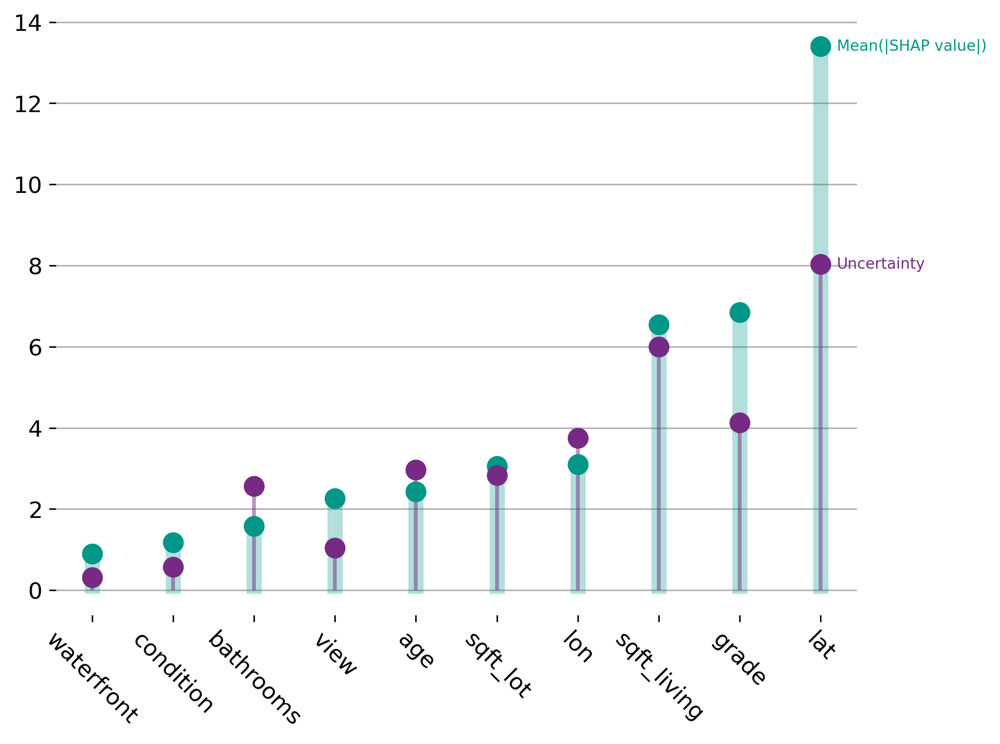

In [22]:
results.plot_absolute_shap_value_with_uncertainty(filename='SeattleHomeSale_absolute_shap_value_with_uncertainty.pdf')

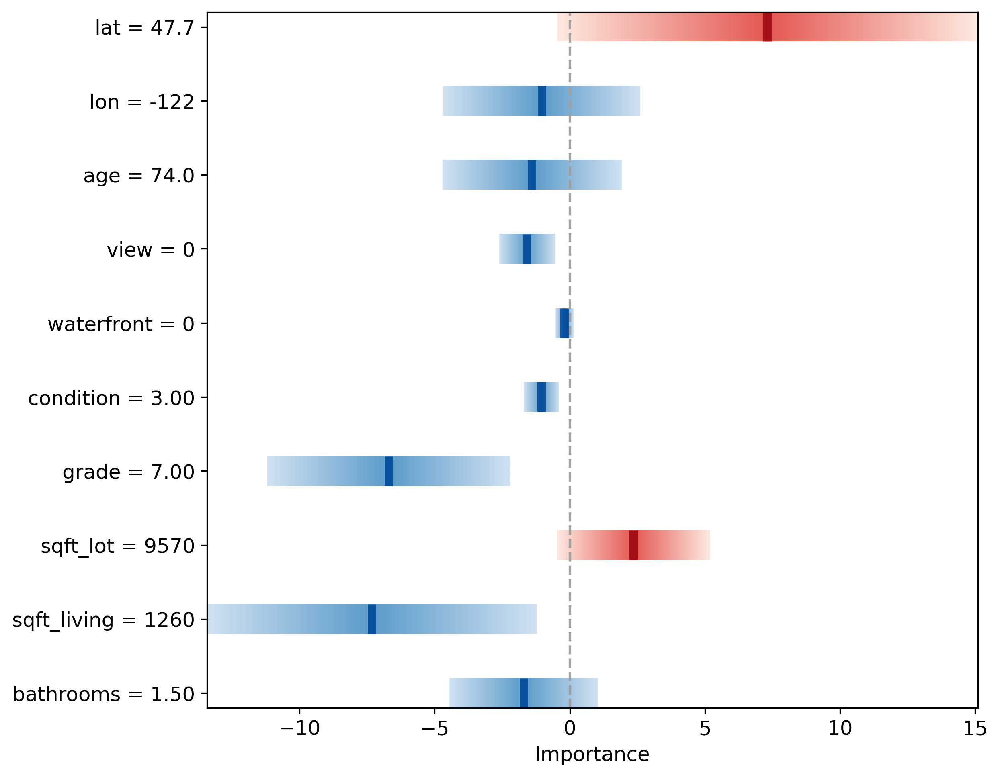

In [23]:
results.plot_shap_values_with_uncertainty(20, filename='SeattleHomeSale_shap_values_with_uncertainty.pdf')

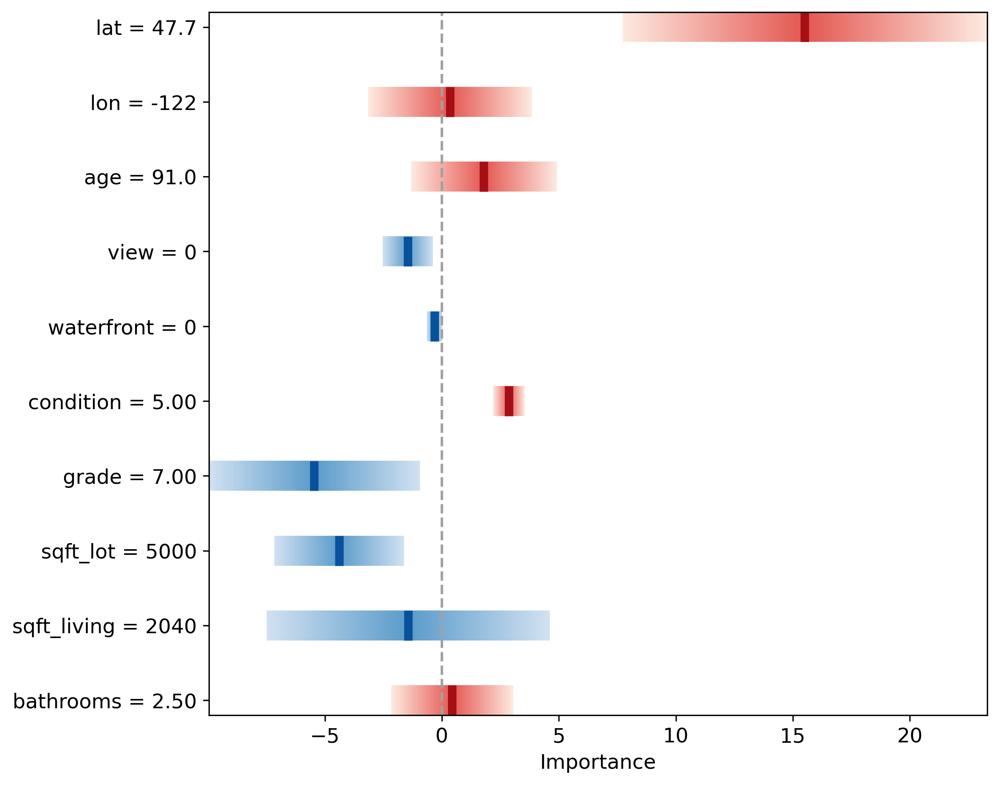

In [24]:
results.plot_shap_values_with_uncertainty(40)

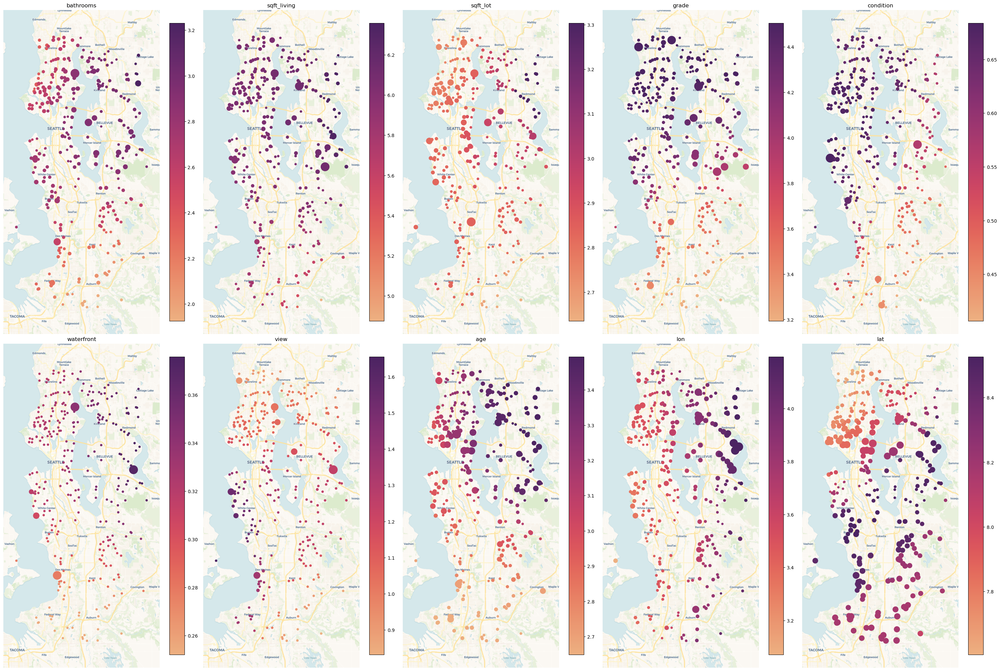

In [25]:
results.plot_geo_uncertainty(figsize=[30, 40], shrink=0.3, s_limits=(4, 18), cmap='flare', filename='SeattleHomeSale_geo_uncertainty.pdf')

C:\Users\Xiayin\miniconda3\envs\UncertaintyGeoXAI\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


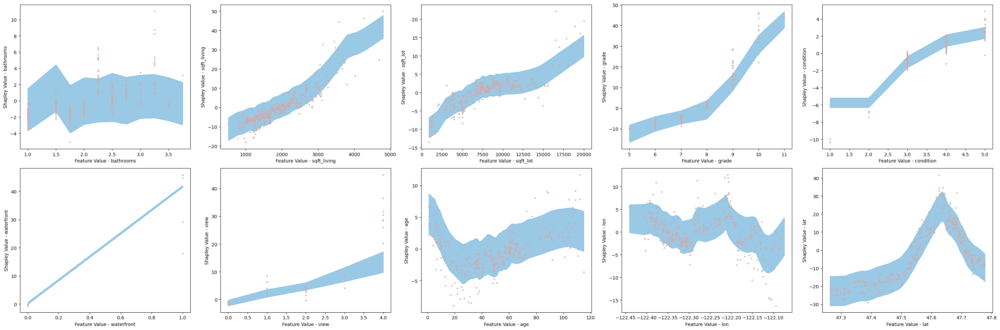

In [26]:
results.plot_partial_dependence_with_fitted_bounds(figsize=[30, 10]) #, filename='SeattleHomeSale_partial_dependence_with_fitted_bounds.pdf')

In [27]:
np.save('seattle_house_price.npy', results.explanation_values)

In [28]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import geoplot as gplt
import geoplot.crs as gcrs
import contextily as cx
import mapclassify as mc

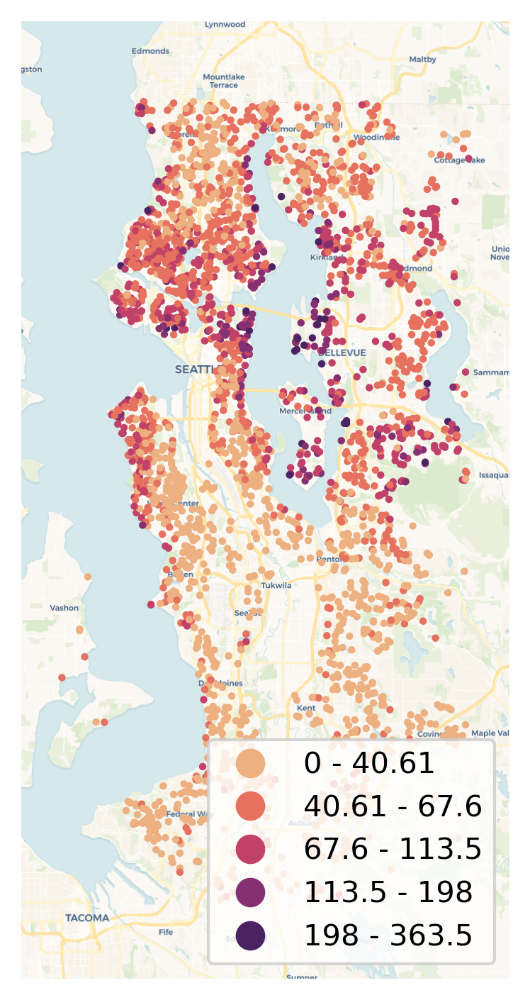

In [29]:
utm = gcrs.WebMercator()

fig, ax = plt.subplots(dpi=300, subplot_kw={'projection': utm})

gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax)
gplt.pointplot(data, hue='price', cmap='flare', legend=True, s=1.5, ax=ax, scheme='NaturalBreaks')

plt.tight_layout()
plt.savefig('./seattle_home_sale_price_distribution_natural_breaks.pdf')
plt.show()

In [30]:
data.columns

Index(['Unnamed: 0', 'bathrooms', 'sqft_living', 'sqft_lot', 'grade',
       'condition', 'waterfront', 'view', 'age', 'UTM_X', 'UTM_Y', 'log_price',
       'geometry', 'lon', 'lat', 'price'],
      dtype='object')

In [31]:
data

,Unnamed: 0,bathrooms,sqft_living,sqft_lot,grade,condition,waterfront,view,age,UTM_X,UTM_Y,log_price,geometry,lon,lat,price
0,0,3.00,2660,4600,8,3,0,0,109,552217.557035,5.274945e+06,6.091315,POINT (-122.30500 47.62580),-122.305,47.6258,123.4000
1,1,2.25,2530,8736,7,4,0,0,57,565692.484331,5.272758e+06,5.790988,POINT (-122.12600 47.60490),-122.126,47.6049,61.8000
2,2,2.00,1390,13464,7,4,0,0,28,562451.661509,5.245291e+06,5.315130,POINT (-122.17300 47.35810),-122.173,47.3581,20.6600
3,3,1.00,940,4264,7,5,0,0,66,546816.935618,5.264407e+06,5.619093,POINT (-122.37800 47.53140),-122.378,47.5314,41.6000
4,4,2.25,2070,7225,8,3,0,0,36,564343.195352,5.244978e+06,5.477121,POINT (-122.14800 47.35510),-122.148,47.3551,30.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2995,1.50,1290,8366,7,3,0,0,58,551377.991268,5.259321e+06,5.380211,POINT (-122.31800 47.48530),-122.318,47.4853,24.0000
2996,2996,1.50,1490,12186,7,4,0,0,65,550796.231636,5.291393e+06,5.566895,POINT (-122.32200 47.77390),-122.322,47.7739,36.8888
2997,2997,1.50,1510,16800,8,5,0,0,59,549619.278143,5.288838e+06,5.618048,POINT (-122.33800 47.75100),-122.338,47.7510,41.5000
2998,2998,2.00,1640,3021,7,3,0,2,56,548198.517745,5.279378e+06,5.732394,POINT (-122.35800 47.66600),-122.358,47.6660,54.0000


In [32]:
data[data['condition'] == 1]

,Unnamed: 0,bathrooms,sqft_living,sqft_lot,grade,condition,waterfront,view,age,UTM_X,UTM_Y,log_price,geometry,lon,lat,price
377,377,1.0,680,1638,6,1,0,4,105,545191.740718,5.270151e+06,5.401401,POINT (-122.39900 47.58320),-122.399,47.5832,25.200
1411,1411,1.0,1010,14244,5,1,1,4,89,545222.371672,5.266195e+06,5.818226,POINT (-122.39900 47.54760),-122.399,47.5476,65.800
1486,1486,1.0,1760,3000,6,1,0,0,115,548955.066945,5.278695e+06,5.547713,POINT (-122.34800 47.65980),-122.348,47.6598,35.295
1914,1914,1.5,720,7450,5,1,0,1,91,546995.680314,5.270254e+06,5.469822,POINT (-122.37500 47.58400),-122.375,47.5840,29.500
2184,2184,1.0,500,7440,5,1,0,0,87,548026.885169,5.263728e+06,5.096910,POINT (-122.36200 47.52520),-122.362,47.5252,12.500
2458,2458,1.5,1430,11173,7,1,0,0,60,563701.308980,5.269235e+06,5.579784,POINT (-122.15300 47.57340),-122.153,47.5734,38.000
2942,2942,1.0,930,7740,5,1,0,0,83,550949.373222,5.256628e+06,5.023252,POINT (-122.32400 47.46110),-122.324,47.4611,10.550


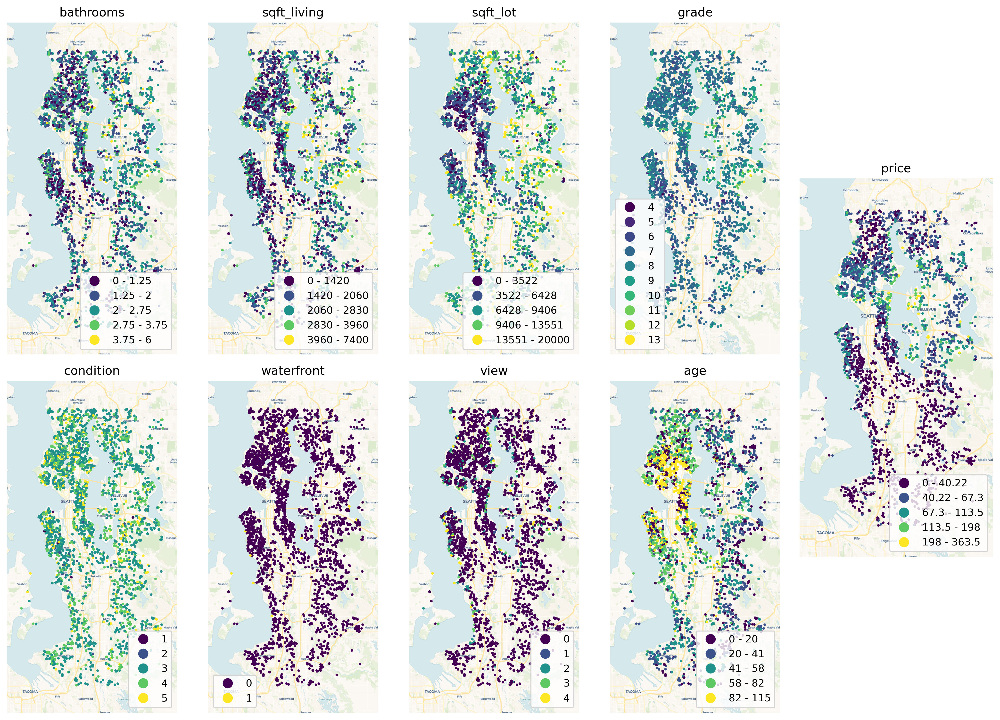

In [33]:
utm = gcrs.WebMercator()

cmap = 'viridis'
s = 1.5

fig, axes = plt.subplots(ncols=5, nrows=2, dpi=300, subplot_kw={'projection': utm}, figsize=(14, 10))

ax1 = axes[0, 0]

gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax1)
gplt.pointplot(data, hue='bathrooms', cmap=cmap, legend=True, s=s, ax=ax1, scheme='NaturalBreaks')
ax1.set_title('bathrooms')

ax2 = axes[0, 1]

gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax2)
gplt.pointplot(data, hue='sqft_living', cmap=cmap, legend=True, s=s, ax=ax2, scheme='NaturalBreaks')
ax2.set_title('sqft_living')

ax3 = axes[0, 2]
gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax3)
gplt.pointplot(data, hue='sqft_lot', cmap=cmap, legend=True, s=s, ax=ax3, scheme='NaturalBreaks')
ax3.set_title('sqft_lot')

ax4 = axes[0, 3]
scheme = mc.UserDefined(data['grade'], bins=[4.5, 5.5, 6.5, 7.5, 8.5, 9.5, 10.5, 11.5, 12.5])
legend_labels = ['4', '5', '6', '7', '8', '9', '10', '11', '12', '13']
gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax4)
gplt.pointplot(data, hue='grade', cmap=cmap, legend=True, s=s, ax=ax4, scheme=scheme, legend_labels=legend_labels)
ax4.set_title('grade')

ax5 = axes[1, 0]
scheme = mc.UserDefined(data['condition'], bins=[1.5, 2.5, 3.5, 4.5])
legend_labels = ['1', '2', '3', '4', '5']
gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax5)
gplt.pointplot(data, hue='condition', cmap=cmap, legend=True, s=s, ax=ax5, scheme=scheme, legend_labels=legend_labels)
ax5.set_title('condition')

ax6 = axes[1, 1]
scheme = mc.UserDefined(data['waterfront'], bins=[0.5])
legend_labels = ['0', '1']
gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax6)
gplt.pointplot(data, hue='waterfront', cmap=cmap, legend=True, s=s, ax=ax6, scheme=scheme, legend_labels=legend_labels)
ax6.set_title('waterfront')

ax7 = axes[1, 2]
scheme = mc.UserDefined(data['view'], bins=[0.5, 1.5, 2.5, 3.5])
legend_labels = ['0','1', '2', '3', '4']
gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax7)
gplt.pointplot(data, hue='view', cmap=cmap, legend=True, s=s, ax=ax7, scheme=scheme, legend_labels=legend_labels)
ax7.set_title('view')
ax8 = axes[1, 3]

gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax8)
gplt.pointplot(data, hue='age', cmap=cmap, legend=True, s=s, ax=ax8, scheme='NaturalBreaks')
ax8.set_title('age')

gs = axes[0, 4].get_gridspec()
for ax in axes[:, 4]:
    ax.remove()
ax9 = fig.add_subplot(gs[:, -1], projection=utm)
ax9.set_title('price')
gplt.webmap(data, projection=utm, provider=cx.providers.CartoDB.Voyager, ax=ax9)
gplt.pointplot(data, hue='price', cmap=cmap, legend=True, s=s, ax=ax9, scheme='NaturalBreaks')

plt.tight_layout()

plt.savefig('seattle_house_price_and_response_variables.pdf', bbox_inches='tight', dpi=400)